In [42]:
import pandas as pd
import numpy as np
import scipy.io as scio
import mat73
import os
import sys
from tqdm import tqdm
from collections import defaultdict
# import openpyxl 
# import dill
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objs as go
from matplotlib.animation import FuncAnimation
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.model_selection import train_test_split
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import permutation_test_score
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.cross_decomposition import PLSRegression
from sklearn.preprocessing import RobustScaler
import helper_function as hf
from gtda.time_series import TakensEmbedding

In [43]:
#IMPORT data from matlab files
dd= pd.read_csv(r"Y:\neurobiology\zimmer\jalaja\imaging\newline\cleaned\for_BundleNet\deltaFoF_alldataset.csv", delimiter=',',parse_dates=True)
dd.columns=dd.columns.str.strip("''")
dd

,AIBL,AIBR,AIZL,ALA,ALNL,ALNR,AQR,AS10,ASKL,ASKR,...,URYVR,VA01,VA11,VA12,VB01,VB02,VD13,target,state,group
0,0.387170,0.097740,0.312340,0.145770,NaN,0.95588,-0.11433,0.003151,1.35830,0.554600,...,0.073543,0.12440,NaN,NaN,0.62955,0.098488,0.015532,2,1,1
1,0.418530,0.069665,0.267290,0.128760,NaN,0.92111,-0.13575,-0.015684,1.27280,0.570670,...,0.046784,0.12474,NaN,NaN,0.61028,0.084541,0.013973,2,1,1
2,0.448780,0.051929,0.239980,0.105750,NaN,0.87986,-0.14115,-0.037594,1.16260,0.580160,...,0.033031,0.12504,NaN,NaN,0.57180,0.079309,-0.002591,2,1,1
3,0.477770,0.045791,0.232590,0.076009,NaN,0.83133,-0.12856,-0.062951,1.02460,0.582280,...,0.033870,0.12532,NaN,NaN,0.51179,0.083855,-0.035988,2,1,1
4,0.475250,0.053608,0.209490,0.073328,NaN,0.85503,-0.13928,-0.052906,0.95813,0.536360,...,0.039577,0.13207,NaN,NaN,0.51291,0.082970,-0.007096,2,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85045,-0.100090,-0.123270,-0.091191,-0.339340,-0.35703,-0.48824,-0.22803,NaN,-0.19723,-0.132620,...,-0.126310,NaN,-0.052055,0.103360,-0.18571,-0.098487,0.198120,2,1,9
85046,-0.086111,-0.106290,-0.089964,-0.339710,-0.34738,-0.48779,-0.20283,NaN,-0.19967,-0.128080,...,-0.127810,NaN,-0.058894,0.097431,-0.19207,-0.100030,0.206260,2,1,9
85047,-0.089498,-0.134590,-0.097088,-0.355450,-0.33665,-0.49817,-0.20000,NaN,-0.19820,-0.117480,...,-0.114520,NaN,-0.066565,0.095080,-0.20473,-0.103260,0.214000,2,1,9
85048,-0.090512,-0.149300,-0.092970,-0.346930,-0.33888,-0.49830,-0.20349,NaN,-0.20218,-0.108090,...,-0.120090,NaN,-0.053817,0.091680,-0.20745,-0.111210,0.203250,2,1,9


In [44]:
#Normalize scaling beaseline and stimulus period separately because of special request
fps = 5
# simple mean imputation from sklearn
imp=SimpleImputer(strategy='mean')
X=dd.drop({'target','state','group'},axis=1)
#Normalize scaling
scaled_datasets_X_baseline = []
scaled_datasets_X_stimulus = []
for n in range(0, 9):
    #robust_scaler=StandardScaler()
    robust_scaler=RobustScaler(with_centering=False, with_scaling=True, quantile_range=(5, 95))
    scaled_data_X_baseline = robust_scaler.fit_transform(X.loc[n*9450:(n*9450)+(390*fps)-1,:])
    scaled_data_X_stimulus = robust_scaler.fit_transform(X.loc[(n*9450)+(390*fps):((n+1)*9450)-1,:])
    
    scaled_datasets_X_baseline.append(scaled_data_X_baseline)
    scaled_datasets_X_stimulus.append(scaled_data_X_stimulus)

# Concatenate scaled datasets from each group
scaled_X_within_group_baseline = np.concatenate(scaled_datasets_X_baseline)
scaled_X_within_group_stimulus = np.concatenate(scaled_datasets_X_stimulus)

# Scale across all groups
scaled_X_across_groups_baseline = robust_scaler.fit_transform(scaled_X_within_group_baseline)
scaled_X_baseline =pd.DataFrame(data=scaled_X_across_groups_baseline,columns=X.columns)

scaled_X_across_groups_stimulus = robust_scaler.fit_transform(scaled_X_within_group_stimulus)
scaled_X_stimulus =pd.DataFrame(data=scaled_X_across_groups_stimulus,columns=X.columns)

normalized=[]
for n in range(0, 9):
   
    normalized.append(scaled_X_baseline.loc[n*390*fps:((n+1)*390*fps)-1,:])
    normalized.append(scaled_X_stimulus.loc[n*1500*fps:((n+1)*1500*fps)-1,:])
    
# Combine all normalized data
normalized = pd.concat(normalized, axis=0).reset_index(drop=True)

# Add back the target, state, and group columns
normalized_data = normalized.copy()
normalized_data['target'] = dd['target'].values
normalized_data['state'] = dd['state'].values
normalized_data['group'] = dd['group'].values

# Ensure column names are clean
normalized_data.columns = normalized_data.columns.str.strip("''")


C:\Users\Jalaja Madhusudhanan\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(
C:\Users\Jalaja Madhusudhanan\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(
C:\Users\Jalaja Madhusudhanan\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(
C:\Users\Jalaja Madhusudhanan\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(
C:\Users\Jalaja Madhusudhanan\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(
C:\Users\Jalaja Madhusudhanan\AppData\Roaming\Python\Python311\site-packages\num

In [131]:
#REPLACE MISSING VALUES
imp=IterativeImputer(random_state=0)
# imp=SimpleImputer(strategy='mean')
dk=imp.fit_transform(normalized_data.drop({'target','state','group'}, axis=1))
df = pd.DataFrame(data=np.c_[dk, dd['target'],dd['state'],dd['group']],columns=dd.columns)

In [7]:
# dk=impute_missing_values_in_dataframe(dd.drop({'target','state','group'}, axis=1))
dk=hf.impute_missing_values_in_dataframe(normalized_data.drop({'target','state','group'}, axis=1))
df = pd.DataFrame(data=np.c_[dk, dd['target'],dd['state'],dd['group']],columns=dd.columns)

C:\Users\Jalaja Madhusudhanan\AppData\Roaming\Python\Python311\site-packages\ppca\_ppca.py:82: RuntimeWarning: divide by zero encountered in log
  det = np.log(np.linalg.det(Sx))


In [8]:
df

,AIBL,AIBR,AIZL,ALA,ALNL,ALNR,AQR,AS10,ASKL,ASKR,...,URYVR,VA01,VA11,VA12,VB01,VB02,VD13,target,state,group
0,0.251238,0.207637,1.501193,0.825515,1.419608,2.513866,-0.464311,0.015814,2.163814,0.913401,...,0.540133,0.509066,0.291175,-0.049080,0.613915,0.474432,0.014760,2.0,1.0,1.0
1,0.271588,0.147995,1.284670,0.729185,1.339273,2.422424,-0.551300,-0.078703,2.027610,0.939867,...,0.343603,0.510457,0.243602,-0.083451,0.595124,0.407247,0.013278,2.0,1.0,1.0
2,0.291217,0.110317,1.153410,0.598876,1.253367,2.313941,-0.573230,-0.188648,1.852058,0.955497,...,0.242595,0.511685,0.198542,-0.107771,0.557599,0.382044,-0.002462,2.0,1.0,1.0
3,0.310029,0.097278,1.117892,0.430449,1.161234,2.186312,-0.522101,-0.315890,1.632220,0.958989,...,0.248757,0.512830,0.156286,-0.120816,0.499080,0.403943,-0.034199,2.0,1.0,1.0
4,0.308394,0.113884,1.006867,0.415266,1.155769,2.248641,-0.565636,-0.265484,1.526331,0.883360,...,0.290671,0.540452,0.165639,-0.128325,0.500172,0.399680,-0.006743,2.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85045,-0.443202,-0.332772,-0.300448,-0.513417,-0.599186,-0.587684,-0.160291,0.071169,-0.553995,-0.348767,...,-0.705256,-0.523463,-0.214125,0.339156,-0.537296,-0.568791,0.386257,2.0,1.0,9.0
85046,-0.381303,-0.286934,-0.296405,-0.513976,-0.582990,-0.587142,-0.142577,0.057765,-0.560848,-0.336827,...,-0.713632,-0.515995,-0.242257,0.319701,-0.555697,-0.577702,0.402127,2.0,1.0,9.0
85047,-0.396300,-0.363331,-0.319876,-0.537791,-0.564983,-0.599636,-0.140588,0.075320,-0.556719,-0.308951,...,-0.639426,-0.513556,-0.273811,0.311986,-0.592325,-0.596356,0.417217,2.0,1.0,9.0
85048,-0.400790,-0.403041,-0.306309,-0.524900,-0.568725,-0.599793,-0.143041,0.085947,-0.567899,-0.284257,...,-0.670527,-0.530494,-0.221373,0.300830,-0.600195,-0.642270,0.396259,2.0,1.0,9.0


In [45]:
def fill_short_states(df, column, max_length=3):
    """
    Identifies short sequences in a specified column of the DataFrame and replaces them with the preceding state.

    Parameters:
    df (pd.DataFrame): The DataFrame containing the state column.
    column (str): The column name for which to fill short sequences.
    max_length (int): The maximum length for a sequence to be considered "short."

    Returns:
    pd.DataFrame: DataFrame with short sequences filled with the previous state.
    """
    
    filled_values = df[column].copy()  # Copy of the column to modify

    i = 0
    while i < len(df):
        # Find the start of a sequence
        start = i
        current_value = df[column].iloc[i]


        # Find the end of the sequence
        while i < len(df) and df[column].iloc[i] == current_value:
            i += 1
        end = i

        # If the sequence length is less than max_length, replace it with the previous state
        if end - start <= max_length and start > 0:
            filled_values[start:end] = df[column].iloc[start - 1]

    df[column] = filled_values
    return df

df = fill_short_states(df, 'state', max_length=3)
print(df)

           AIBL      AIBR      AIZL       ALA      ALNL      ALNR       AQR  \
0      0.251238  0.207637  1.501193  0.825515  1.419608  2.513866 -0.464311   
1      0.271588  0.147995  1.284670  0.729185  1.339273  2.422424 -0.551300   
2      0.291217  0.110317  1.153410  0.598876  1.253367  2.313941 -0.573230   
3      0.310029  0.097278  1.117892  0.430449  1.161234  2.186312 -0.522101   
4      0.308394  0.113884  1.006867  0.415266  1.155769  2.248641 -0.565636   
...         ...       ...       ...       ...       ...       ...       ...   
85045 -0.443202 -0.332772 -0.300448 -0.513417 -0.599186 -0.587684 -0.160291   
85046 -0.381303 -0.286934 -0.296405 -0.513976 -0.582990 -0.587142 -0.142577   
85047 -0.396300 -0.363331 -0.319876 -0.537791 -0.564983 -0.599636 -0.140588   
85048 -0.400790 -0.403041 -0.306309 -0.524900 -0.568725 -0.599793 -0.143041   
85049 -0.399139 -0.421290 -0.271069 -0.490525 -0.585172 -0.592727 -0.148102   

           AS10      ASKL      ASKR  ...     URYVR 

In [48]:
annotations = df["state"]
conditions = [
    ((annotations) == 1.0),
    ((annotations)  == 2.0),
    ((annotations)  == 3.0),
    ((annotations)  == 4.0)
]

values = ['forward', 'reversal', 'sustained reversal', 'turn']

# replace values based on conditions, 1 = forward, 2 = reversal (rise), 3 = reversal (sustained), 4 = turn
transformed_annotations = np.select(conditions, values)

df["state"] = hf.determine_turn(df, transformed_annotations) # to determine whether a turn is a dorsal or a ventral turn


In [49]:
state_mapping = {
    'forward': 1,
    'reversal': 2,
    'sustained reversal': 3,
    'ventral': 4,
    'dorsal': 5  # Adjust based on your specific categories
}

# Apply the mapping to the 'state' column
df['state'] = df['state'].replace(state_mapping)

# Check the results
print(df['state'].unique())

[1 2 3 4 '0']


In [12]:
# Find isolated runs of target == 1
isolated_indices = []

for i in range(1, len(df) - 1):
    if df['target'].iloc[i] == 1 and df['target'].iloc[i-1] != 1 and df['target'].iloc[i+1] != 1:
        isolated_indices.append(i)

# Replace the isolated instances of target == 1 with 2
df.loc[isolated_indices, 'target'] = 2

In [13]:
# remove sensory neurons for now!
df_no_sensory=df.drop({'URXL','URXR','AQR','PQR','AUAL','AUAR','RMGL','RMGR','PVPL','IL2L','IL2R','BAGL','BAGR'},axis=1)
df_sensory=df[['URXL','URXR','AQR','PQR','AUAL','AUAR','RMGL','RMGR','PVPL','IL2L','IL2R','BAGL','BAGR','target','state','group']]

In [20]:
# Parameters
interval_start = 450 # start at 390 seconds
interval_step = 90  # interval of 90 seconds
slice_duration = 60  # slice the prestimulus 60 seconds
stimulus_period=30
fps = 5  # frames per second

# Create the new sliced DataFrame
sliced_df , triggered_df= create_sliced_dataframe(df_no_sensory, interval_start, interval_step, slice_duration,stimulus_period, fps)
print(triggered_df)

           AIBL      AIBR      AIZL       ALA      ALNL      ALNR      AS10  \
1950  -0.120777 -0.259240  0.201684  0.108614 -0.074099 -0.095842  0.050057   
1951  -0.140790 -0.226471  0.313163  0.150455 -0.061497 -0.108601 -0.003534   
1952  -0.170853 -0.266413  0.511999  0.174565 -0.015447 -0.085943 -0.018358   
1953  -0.186939 -0.254684  0.443138  0.158520 -0.034293 -0.090244  0.071262   
1954  -0.193594 -0.252521  0.381341  0.109499 -0.055849 -0.096667  0.089051   
...         ...       ...       ...       ...       ...       ...       ...   
84745 -0.254121 -0.169739 -0.434704 -0.548215 -0.498491 -0.624480  0.030711   
84746 -0.249887 -0.168864 -0.463730 -0.547807 -0.499934 -0.616608  0.011702   
84747 -0.336801 -0.252115 -0.420306 -0.538214 -0.497400 -0.610349 -0.013286   
84748 -0.378008 -0.252572 -0.428872 -0.545961 -0.482363 -0.627140  0.019478   
84749 -0.392886 -0.218646 -0.458722 -0.558942 -0.462140 -0.650600  0.068978   

           ASKL      ASKR      AVAL  ...     URYVR 

In [21]:
# Drop rows where 'target' is 2
triggered_df_forPLS = triggered_df[triggered_df['target'] != 2]

In [22]:
triggered_df_forPLS.reset_index(drop=True, inplace=True)

In [23]:
interval_start = 450 # start at 390 seconds
interval_step = 90  # interval of 90 seconds
slice_duration = 5 # slice the prestimulus 30 seconds
stimulus_period=30
fps = 5  # frames per second

# Create the new sliced DataFrame
sliced_df , triggered_df= create_sliced_dataframe(df_no_sensory, interval_start, interval_step, slice_duration,stimulus_period, fps)
print(sliced_df)


           AIBL      AIBR      AIZL       ALA      ALNL      ALNR      AS10  \
2225  -0.202239 -0.286320  0.140922 -0.304894 -0.058063 -0.147015  0.021741   
2226  -0.209031 -0.294757  0.253985 -0.348232 -0.047646 -0.145105 -0.070636   
2227  -0.167041 -0.275720  0.082177 -0.304692 -0.036408 -0.133756 -0.054812   
2228  -0.148217 -0.296488  0.153714 -0.239550 -0.010642 -0.150615 -0.057986   
2229  -0.142171 -0.332932  0.296424 -0.178570  0.013155 -0.180532 -0.090876   
...         ...       ...       ...       ...       ...       ...       ...   
84595 -0.234141 -0.381661 -0.235542 -0.453336 -0.500286 -0.624528  0.151405   
84596 -0.234106 -0.378502 -0.210888 -0.451097 -0.490401 -0.617968  0.138570   
84597 -0.274135 -0.376856 -0.293723 -0.469389 -0.511447 -0.642391  0.111846   
84598 -0.306026 -0.349077 -0.288672 -0.471855 -0.522506 -0.642223  0.111913   
84599 -0.328578 -0.320921 -0.267557 -0.466151 -0.529270 -0.632485  0.118165   

           ASKL      ASKR      AVAL  ...     URYVR 

In [24]:
df_pls=pd.DataFrame(data=sliced_df)
# Drop rows where 'target_vector' is 2
sliced_df_forPLS = df_pls[df_pls['target'] != 2]
pls_x=sliced_df_forPLS.drop({'target','state','group'},axis=1)
motor_neurons={'DB01','DB02','DB07','VB01','VB02','AS10','DA01','DA07','DA09','VA01','VA11','VA12','VD13','target','state','group'}
exclude={'ASKR','BAGL','URXR','VB01','SMBDL','SIADL','AVAL','AIBL','SMDVL','RIML','RIMR','ALNL','SMDVR','DB02','RIVL','DA09','URYVR','AVAR','AQR','VA01','URYDL','AUAL','AVEL','DA07','IL2R','target','state','group'}

pls_y=sliced_df_forPLS['target']
pls_groups=sliced_df_forPLS['group']

In [25]:
from sklearn.cross_decomposition import PLSCanonical
from sklearn.cross_decomposition import PLSRegression

pls = PLSRegression(n_components=5)
#pls.fit(pls_x_nomotor, y)
pls.fit(pls_x,pls_y)

PLSRegression(n_components=5)

In [26]:
# Get indices of df and sliced_df
df_indices = df.index
sliced_df_indices = sliced_df.index

# Find indices that are in df but NOT in sliced_df
remaining_indices = df_indices.difference(sliced_df_indices)

# Create a new DataFrame with only these remaining indices
remaining_df = df.loc[remaining_indices]
remaining_df=df_no_sensory
print(remaining_df)

           AIBL      AIBR      AIZL       ALA      ALNL      ALNR      AS10  \
0      0.251238  0.207637  1.501193  0.825515  1.419608  2.513866  0.015814   
1      0.271588  0.147995  1.284670  0.729185  1.339273  2.422424 -0.078703   
2      0.291217  0.110317  1.153410  0.598876  1.253367  2.313941 -0.188648   
3      0.310029  0.097278  1.117892  0.430449  1.161234  2.186312 -0.315890   
4      0.308394  0.113884  1.006867  0.415266  1.155769  2.248641 -0.265484   
...         ...       ...       ...       ...       ...       ...       ...   
85045 -0.443202 -0.332772 -0.300448 -0.513417 -0.599186 -0.587684  0.071169   
85046 -0.381303 -0.286934 -0.296405 -0.513976 -0.582990 -0.587142  0.057765   
85047 -0.396300 -0.363331 -0.319876 -0.537791 -0.564983 -0.599636  0.075320   
85048 -0.400790 -0.403041 -0.306309 -0.524900 -0.568725 -0.599793  0.085947   
85049 -0.399139 -0.421290 -0.271069 -0.490525 -0.585172 -0.592727  0.092520   

           ASKL      ASKR      AVAL  ...     URYVR 

In [27]:
pls.score(pls_x,pls_y)

0.420319085939139

In [28]:
pls_df_for_lda_stim=pd.DataFrame(data=pls.transform(pls_x), columns=['PLS1','PLS2','PLS3','PLS4','PLS5'])


In [29]:
from sklearn.model_selection import StratifiedGroupKFold
lda = LinearDiscriminantAnalysis()
cv =StratifiedGroupKFold(n_splits=5, random_state=None)
cv_scores = cross_val_score(lda,pls_df_for_lda_stim, pls_y, scoring='accuracy', cv=cv, groups=pls_groups, n_jobs=-1)
cv_scores.mean()
# cv_scores.std()

0.7498154259533569

C:\Users\Jalaja Madhusudhanan\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LinearDiscriminantAnalysis was fitted with feature names
  warnings.warn(
C:\Users\Jalaja Madhusudhanan\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LinearDiscriminantAnalysis was fitted with feature names
  warnings.warn(


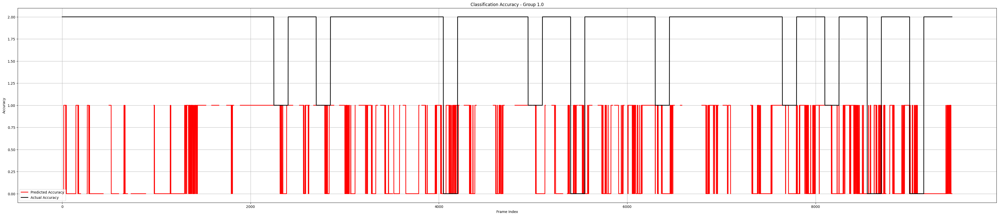

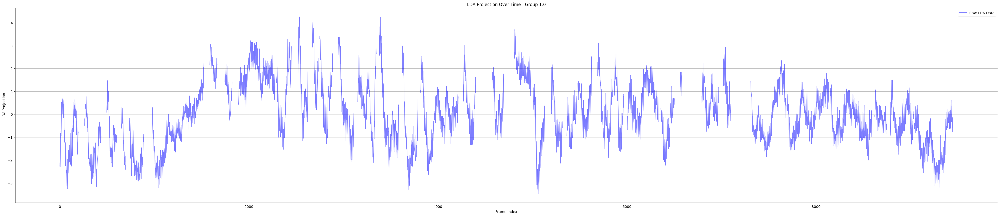

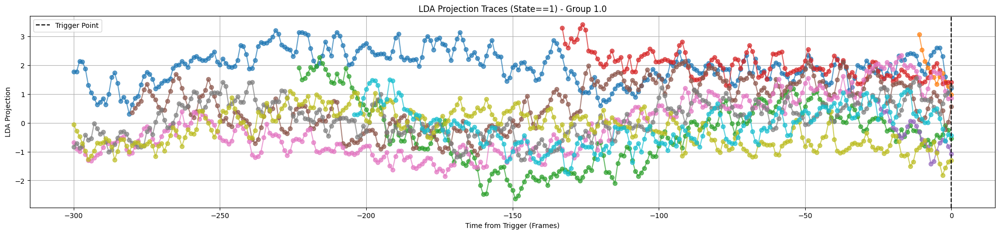

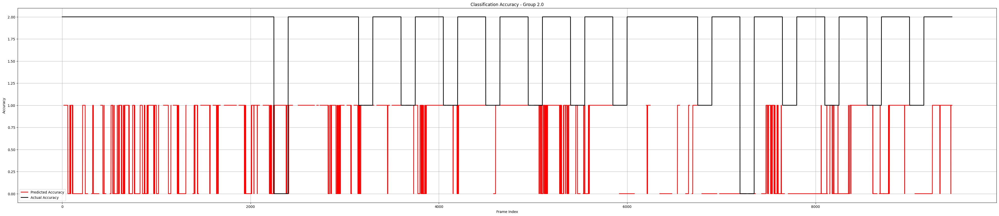

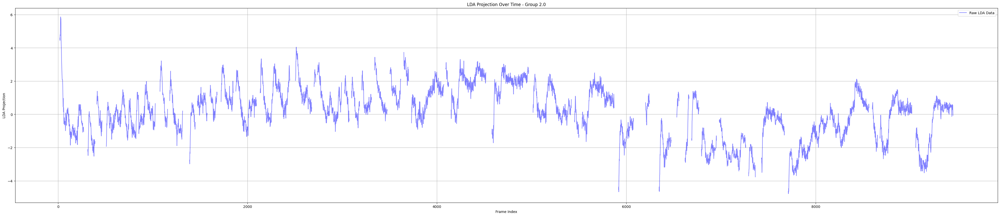

...

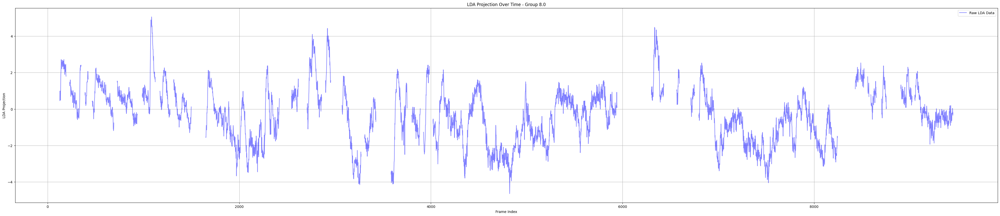

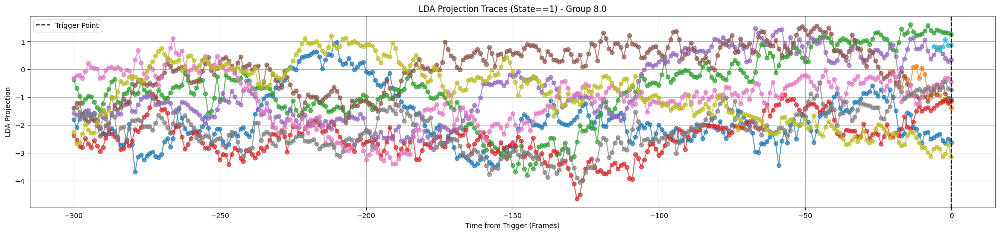

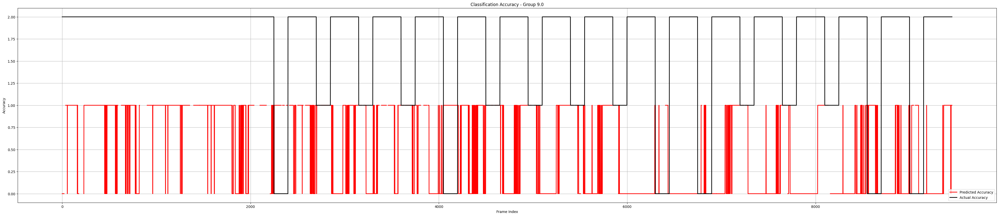

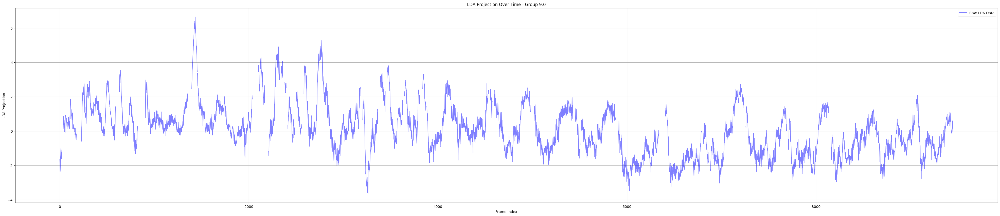

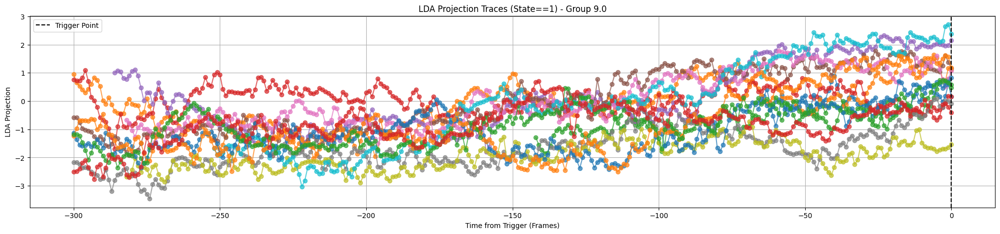

In [31]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

# Define total length
total_length = 1890*fps
start_frames = np.arange(450, 1890, 90) * fps
# Transform data using PLS
pls_transformed = pls.transform(remaining_df.drop(columns=['target', 'state', 'group']))  # Shape: (n_frames, n_components)

# Extract target labels and groups
neuron_traces=remaining_df.drop(columns=['target', 'state', 'group'])
y = remaining_df['target'].values  
groups = remaining_df['group'].values  
states = remaining_df['state'].values# Extract state values
targets= remaining_df['target'].values
unique_groups = np.unique(groups)  # Get unique group labels
indices_remaining = remaining_df.index  # Save original indices

# Fit LDA on all data
lda.fit(pls_df_for_lda_stim, pls_y)

# Predict using LDA
x_pred = lda.transform(pls_transformed)
y_pred = lda.predict(pls_transformed)

# Loop through each group and plot separately
for group in unique_groups:
    # Select indices for the current group
    group_indices = np.where(groups == group)[0]

    # Extract group-specific predictions and actual values
    y_group = y[group_indices]
    y_pred_group = y_pred[group_indices]
    x_pred_group = x_pred[group_indices]
    state_group = states[group_indices] 
    indices_group = indices_remaining[np.where(groups == 1)[0]] # Keep the actual indices

    # Create NaN-filled arrays of size 9450
    y_filled = np.full(total_length, np.nan)
    y_pred_filled = np.full(total_length, np.nan)
    x_pred_filled = np.full(total_length, np.nan)

     # Place values at correct indices
    valid_mask = ~(np.isin(state_group, [2, 3]))  # Mask for valid indices (not state 2 or 3)
    valid_indices = indices_group[valid_mask]  # Keep only valid indices

    y_filled[indices_group] = y_group
    y_pred_filled[valid_indices] = y_pred_group[valid_mask].ravel()
    x_pred_filled[valid_indices] = x_pred_group[valid_mask].ravel()
    # x_pred_filled[indices_group] = x_pred_group.ravel()
    
    # Plot predicted vs. actual accuracy with gaps
    plt.figure(figsize=(50, 10))         
    plt.plot(y_pred_filled, color='r', linewidth=2, label="Predicted Accuracy")
    plt.plot(y_filled, color='k', linewidth=2, label="Actual Accuracy")
    plt.xlabel("Frame Index")
    plt.ylabel("Accuracy")
    plt.title(f"Classification Accuracy - Group {group}")
    plt.legend()
    plt.grid(True)
    plt.show()
    
            
    # Plot LDA transformed data with gaps
    plt.figure(figsize=(50, 10))
    plt.plot(x_pred_filled, color='b', alpha=0.5, label="Raw LDA Data")
    plt.xlabel("Frame Index")
    plt.ylabel("LDA Projection")
    plt.title(f"LDA Projection Over Time - Group {group}")
    plt.legend()
    plt.grid(True)
    plt.show()
    
    plt.figure(figsize=(25, 5))

    # Loop through each start_frame
    for start_frame in start_frames:
        if start_frame not in indices_group:
            continue  # Skip if start_frame is not in the group

        start_idx = np.where(indices_group == start_frame)[0][0]  # Find index of start_frame

        # Trace back as long as state == 1
        trace_indices = []
        for i in range(start_idx, -1, -1):  # Loop backward
            time_relative = indices_group[i] - start_frame
            if state_group[i] != 1 or time_relative < -300:
                break  # Stop if state is not 1
            trace_indices.append(i)

        # Reverse to maintain chronological order
        trace_indices = trace_indices[::-1]

        # Convert original indices to time relative to trigger (t = 0 at start_frame)
        time_relative = np.array(indices_group[trace_indices]) - start_frame

        if len(trace_indices) > 0:
            plt.plot(time_relative, x_pred_group[trace_indices], marker='o', linestyle='-', alpha=0.7)

    plt.axvline(0, color='k', linestyle='--', label="Trigger Point")  # Mark t = 0
    plt.xlabel("Time from Trigger (Frames)")
    plt.ylabel("LDA Projection")
    plt.title(f"LDA Projection Traces (State==1) - Group {group}")
    plt.legend()
    plt.grid(True)
    plt.show()

C:\Users\Jalaja Madhusudhanan\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
C:\Users\Jalaja Madhusudhanan\AppData\Roaming\Python\Python311\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


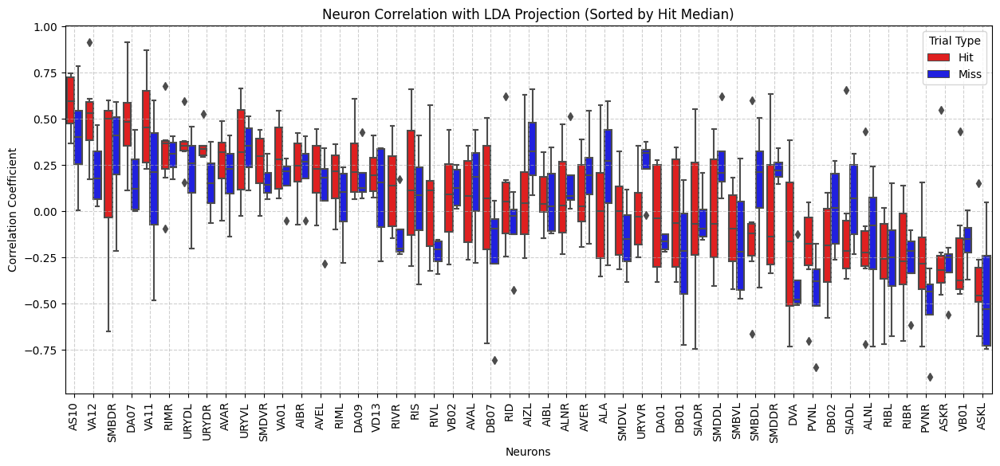

In [167]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Get neuron column names (exclude 'target', 'state', 'group')
neuron_columns = [col for col in remaining_df.columns if col not in ['target', 'state', 'group']]

# Dictionaries to store correlation values for hit and miss trials
neuron_correlations_hit = {neuron: [] for neuron in neuron_columns}
neuron_correlations_miss = {neuron: [] for neuron in neuron_columns}

# Loop through each group
for group in unique_groups:
    group_indices = np.where(groups == group)[0]
    
    # Extract group-specific data
    x_pred_group = x_pred[group_indices]
    state_group = states[group_indices] 
    target_group = targets[group_indices]  # Use target labels
    neuron_traces_group = neuron_traces.loc[group_indices, :]
    indices_group = indices_remaining[group_indices]

    # Loop through each start_frame
    for start_frame in start_frames:
        if start_frame not in indices_group:
            continue  # Skip if start_frame is not in the group
        
        start_idx = np.where(indices_group == start_frame)[0][0]

        # Determine hit/miss classification
        if start_idx + 1 < len(target_group):
            trial_class = 'hit' if target_group[start_idx + 1] == 1 else 'miss'
        else:
            continue  # Ignore if out of bounds

        # Trace back as long as state == 1 and within time window
        trace_indices = []
        for i in range(start_idx, -1, -1):  
            time_relative = indices_group[i] - start_frame
            if state_group[i] != 1:
                break
            if time_relative >= -300:  
                trace_indices.append(i)

        # Reverse for chronological order
        trace_indices = trace_indices[::-1]

        if len(trace_indices) > 1:  # Ensure enough data points
            # Extract neuron activity for trace_indices
            neuron_activity = neuron_traces_group.iloc[trace_indices][neuron_columns].values  # Shape: (n_frames, n_neurons)
            lda_projection = x_pred_group[trace_indices].ravel()  # Shape: (n_frames,)

            # Compute correlation for each neuron
            for neuron_idx, neuron in enumerate(neuron_columns):
                if len(neuron_activity[:, neuron_idx]) > 1 and len(lda_projection) > 1:
                    correlation = np.corrcoef(neuron_activity[:, neuron_idx], lda_projection)[0, 1]
                    
                    if not np.isnan(correlation):  # Avoid NaN values
                        if trial_class == 'hit':
                            neuron_correlations_hit[neuron].append(correlation)
                        else:
                            neuron_correlations_miss[neuron].append(correlation)

# Convert data to DataFrame for sorting
df_hit = pd.DataFrame.from_dict(neuron_correlations_hit, orient='index').T.melt(var_name='Neuron', value_name='Correlation')
df_hit['Class'] = 'Hit'

df_miss = pd.DataFrame.from_dict(neuron_correlations_miss, orient='index').T.melt(var_name='Neuron', value_name='Correlation')
df_miss['Class'] = 'Miss'

df_combined = pd.concat([df_hit, df_miss], ignore_index=True)

# Compute median correlation for sorting
median_hit = df_combined[df_combined['Class'] == 'Hit'].groupby('Neuron')['Correlation'].median()
sorted_neurons = median_hit.sort_values(ascending=False).index.tolist()

# Sort DataFrame
df_combined['Neuron'] = pd.Categorical(df_combined['Neuron'], categories=sorted_neurons, ordered=True)

# Plot side-by-side boxplots
plt.figure(figsize=(15, 6))
sns.boxplot(data=df_combined, x='Neuron', y='Correlation', hue='Class', palette={'Hit': 'red', 'Miss': 'blue'})

plt.xticks(rotation=90)  # Rotate x-axis labels for readability
plt.xlabel("Neurons")
plt.ylabel("Correlation Coefficient")
plt.title("Neuron Correlation with LDA Projection (Sorted by Hit Median)")
plt.legend(title="Trial Type")
plt.grid(linestyle='--', alpha=0.6)
plt.show()

In [209]:
x_pred

array([[-4.36259539],
       [-3.6126888 ],
       [-3.3702503 ],
       ...,
       [-0.44983378],
       [-0.29418655],
       [-0.05904566]])

In [36]:
import numpy as np
import pandas as pd

def smooth_data(data, window=25):
    return np.array([
        pd.Series(trace).rolling(window, center=True, min_periods=1).mean().values
        for trace in data
    ])

# Lists to store traces
lda_traces_hit = []
lda_traces_miss = []

correlations_hit = []
correlations_miss = []

# Set fixed trace length
trace_length = 200

# Loop through each group
for group in unique_groups:

    group_indices = np.where(groups == group)[0]

    # Extract group-specific data
    x_pred_group = x_pred[group_indices]
    state_group = states[group_indices]
    target_group = targets[group_indices]

    indices_group = indices_remaining[np.where(groups == 1)[0]]

    # Loop through each start_frame
    for start_frame in start_frames:

        if start_frame not in indices_group:
            continue

        start_idx = np.where(indices_group == start_frame)[0][0]

        # Determine hit/miss classification
        if start_idx + 1 < len(target_group):

            if target_group[start_idx + 1] == 1:
                trial_class = 'hit'
            elif target_group[start_idx + 1] == 0:
                trial_class = 'miss'
            else:
                continue

        else:
            continue

        # Initialize trace with NaNs
        lda_trace = np.full(trace_length, np.nan)

        # Walk backward while state == 1
        trace_indices = []

        for i in range(start_idx, -1, -1):

            if state_group[i] !=1:
                break

            trace_indices.append(i)

            if len(trace_indices) == trace_length:
                break

        trace_indices.reverse()

        # Fill trace values
        if trace_indices:
            lda_trace[-len(trace_indices):] = x_pred_group[trace_indices].ravel().astype(float)

        # Store trace
        if trial_class == 'hit':
            lda_traces_hit.append(lda_trace)
        else:
            lda_traces_miss.append(lda_trace)

# Convert to numpy arrays
lda_traces_hit = np.array(lda_traces_hit)
lda_traces_miss = np.array(lda_traces_miss)

# Compute class means using NaN-safe mean 
lda_mean_hit = np.nanmean(lda_traces_hit, axis=0) 
lda_mean_miss = np.nanmean(lda_traces_miss, axis=0)

# Smooth each trace before computing correlation
smoothed_lda_traces_hit = smooth_data(lda_traces_hit)
smoothed_lda_traces_miss = smooth_data(lda_traces_miss)

# Smooth the mean traces
smoothed_lda_mean_hit = smooth_data(lda_mean_hit)[0]
smoothed_lda_mean_miss = smooth_data(lda_mean_miss)[0]

# smoothed_lda_mean_hit = smoothed_lda_traces_hit.mean(axis=0)
# smoothed_lda_mean_miss = smoothed_lda_traces_miss.mean(axis=0)

# Compute correlations after smoothing
# correlations_hit = [
#     pd.Series(trace).corr(pd.Series(smoothed_lda_mean_hit), method='pearson')
#     if not np.isnan(trace).all() and np.nanstd(trace) != 0 else np.nan
#     for trace in smoothed_lda_traces_hit
# ]

# correlations_miss = [
#     pd.Series(trace).corr(pd.Series(smoothed_lda_mean_miss), method='pearson')
#     if not np.isnan(trace).all() and np.nanstd(trace) != 0 else np.nan
#     for trace in smoothed_lda_traces_miss
# ]
correlations_hit = [ pd.Series(np.nan_to_num(trace)).corr(pd.Series(lda_mean_hit), method='pearson') if not np.isnan(trace).all() and np.nanstd(trace) != 0 else np.nan for trace in lda_traces_hit ] 
correlations_miss = [ pd.Series(np.nan_to_num(trace)).corr(pd.Series(lda_mean_miss), method='pearson') if not np.isnan(trace).all() and np.nanstd(trace) != 0 else np.nan for trace in lda_traces_miss ]

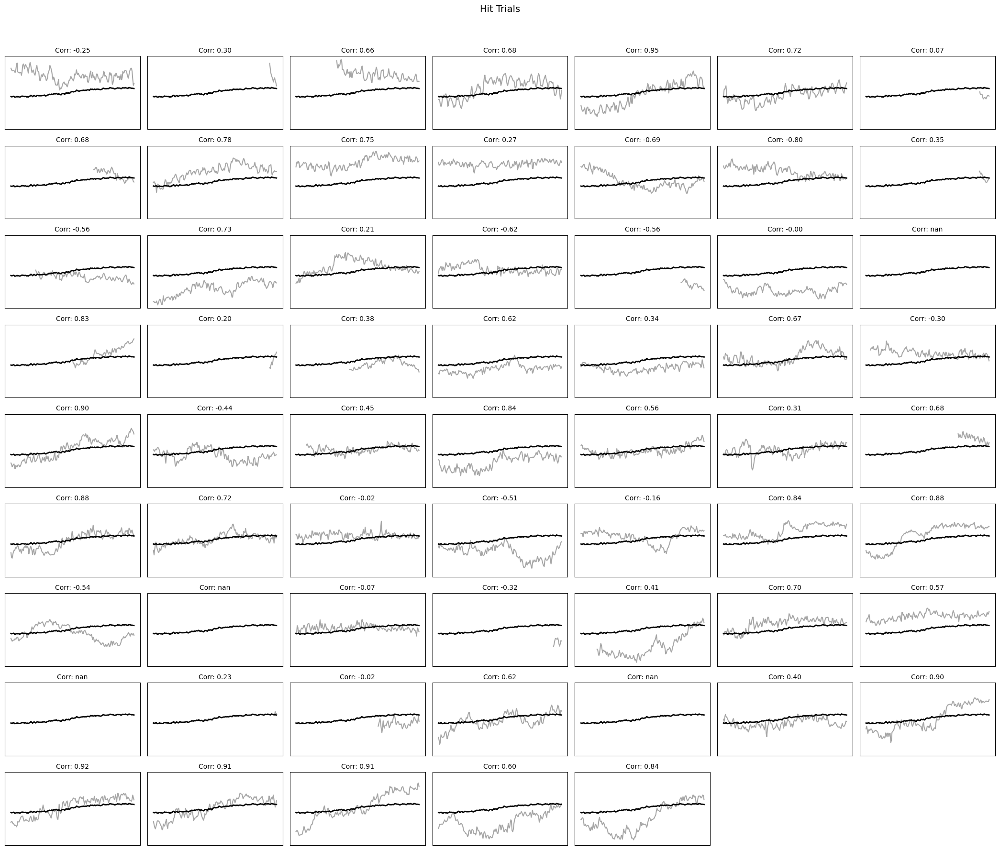

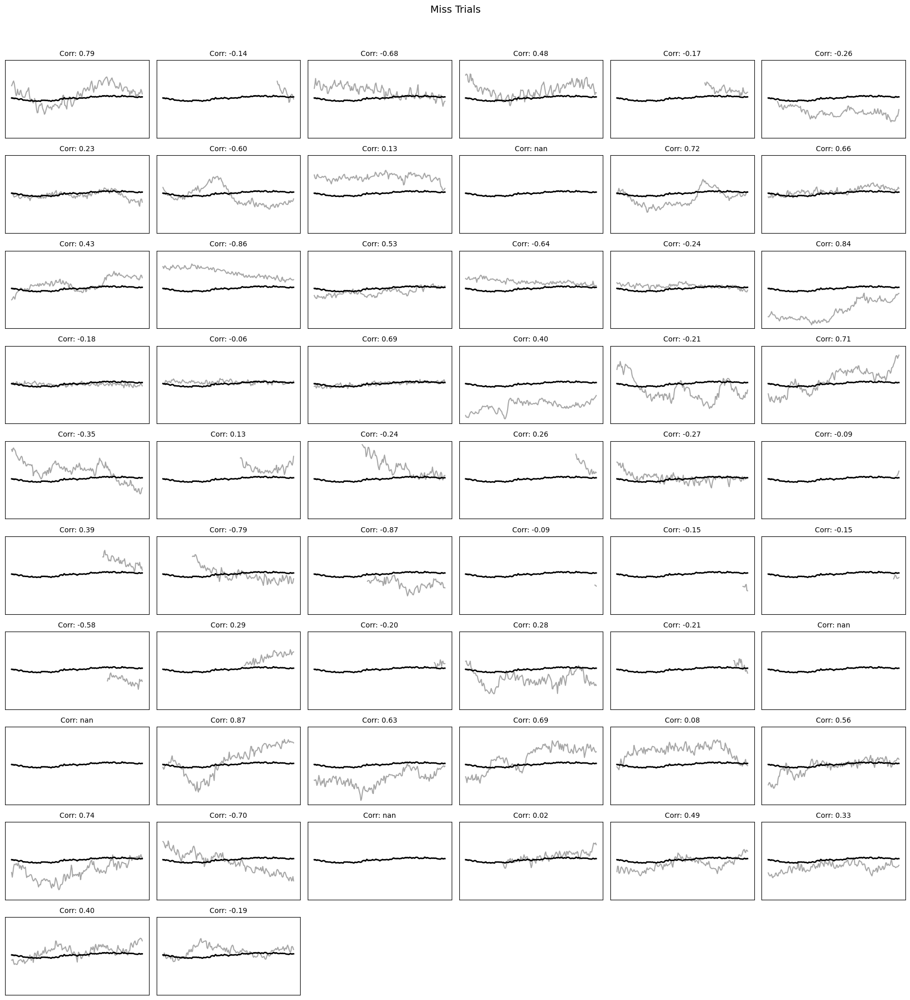

In [37]:
import numpy as np
import matplotlib.pyplot as plt

def plot_traces_grid(lda_traces, lda_mean, correlations, title, rows=5, cols=5):
    """
    Plot individual LDA traces overlaid on the class mean in a grid format.
    
    Parameters:
    - lda_traces: List/array of individual traces.
    - lda_mean: Mean trace of the corresponding class.
    - correlations: List/array of correlation values.
    - title: Title for the entire grid.
    - rows, cols: Number of subplots in the grid.
    """
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 2), sharex=True, sharey=True)
    axes = axes.flatten()  # Flatten for easy iteration

    num_traces = len(lda_traces)
    num_plots = min(rows * cols, num_traces)  # Ensure we don’t exceed available traces

    time_axis = np.arange(len(lda_mean))  # X-axis: time steps

    for i in range(num_plots):
        ax = axes[i]

        # Plot the individual trace
        ax.plot(time_axis, lda_traces[i], color='gray', alpha=0.7, label="Individual Trace")
        
        # Plot the class mean trace
        ax.plot(time_axis, lda_mean, color='black', linewidth=2, label="Class Mean")
        
        # Show correlation in the title
        correlation = correlations[i] if i < len(correlations) else np.nan
        ax.set_title(f"Corr: {correlation:.2f}", fontsize=10)

        ax.set_xticks([])
        ax.set_yticks([])

    # Hide unused subplots
    for i in range(num_plots, len(axes)):
        fig.delaxes(axes[i])

    plt.suptitle(title, fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# Define grid size (adjust based on number of traces)
grid_rows, grid_cols = 5, 5  # Adjust if needed

# Plot Hit traces
plot_traces_grid(lda_traces_hit, lda_mean_hit, correlations_hit, "Hit Trials",10,7)

# Plot Miss traces
plot_traces_grid(lda_traces_miss, lda_mean_miss, correlations_miss, "Miss Trials",10,6)

C:\Users\Jalaja Madhusudhanan\AppData\Roaming\Python\Python311\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Jalaja Madhusudhanan\AppData\Roaming\Python\Python311\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


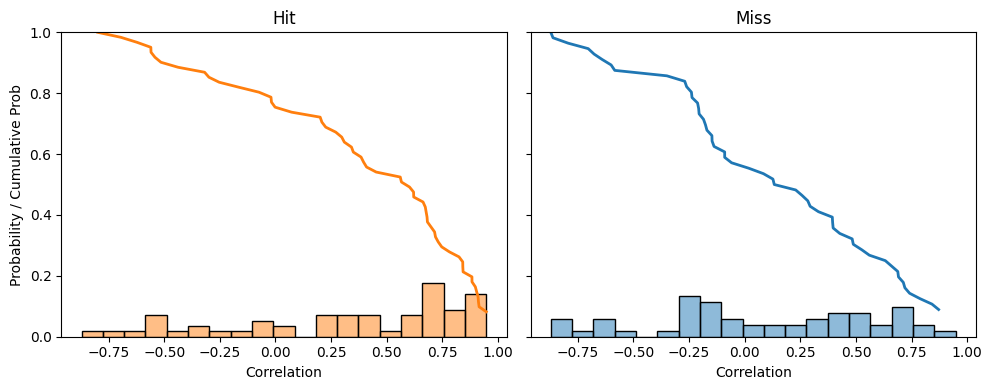

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Create DataFrame
df_corr = pd.DataFrame({
    'Correlation': correlations_hit + correlations_miss,
    'Class': ['Hit'] * len(correlations_hit) + ['Miss'] * len(correlations_miss)
})

# Set up subplots
fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharey=True)

# Define common bins
bins = np.linspace(df_corr["Correlation"].min(), df_corr["Correlation"].max(), 20)

# Function to plot hist and cumulative prob
def plot_hist_cumprob(ax, data, label, color):
    # Histogram
    sns.histplot(
        data=data,
        x="Correlation",
        bins=bins,
        ax=ax,
        color=color,
        stat="probability",
        edgecolor='black',
        alpha=0.5
    )

    # Complementary CDF
    sorted_corr = np.sort(data["Correlation"].values)
    cum_prob = 1.0 - np.arange(0, len(sorted_corr)) / len(sorted_corr)
    ax.plot(sorted_corr, cum_prob, color=color, linewidth=2)

    ax.set_title(label)
    ax.set_xlabel("Correlation")
    ax.set_ylim(0, 1)

# Plot both
plot_hist_cumprob(axes[0], df_corr[df_corr["Class"] == "Hit"], "Hit", '#ff7f0e')
plot_hist_cumprob(axes[1], df_corr[df_corr["Class"] == "Miss"], "Miss", '#1f77b4')

axes[0].set_ylabel("Probability / Cumulative Prob")
plt.tight_layout()
plt.show()

In [105]:
def smooth_traces(traces, window=25):
    return (
        pd.DataFrame(traces)
        .T
        .rolling(window, center=True, min_periods=1)
        .mean()
        .T
        .values
    )

# Smooth traces
smoothed_lda_traces_hit = smooth_traces(lda_traces_hit)
smoothed_lda_traces_miss = smooth_traces(lda_traces_miss)

# Smooth mean traces (FIXED)
smoothed_lda_mean_hit = smooth_traces(lda_mean_hit[np.newaxis, :])[0]
smoothed_lda_mean_miss = smooth_traces(lda_mean_miss[np.newaxis, :])[0]

# Correlations
correlations_hit = [
    pd.Series(trace).corr(pd.Series(smoothed_lda_mean_hit))
    if not np.isnan(trace).all() and np.nanstd(trace) != 0 else np.nan
    for trace in smoothed_lda_traces_hit
]

correlations_miss = [
    pd.Series(trace).corr(pd.Series(smoothed_lda_mean_miss))
    if not np.isnan(trace).all() and np.nanstd(trace) != 0 else np.nan
    for trace in smoothed_lda_traces_miss
]

In [106]:
correlations_hit

[-0.3284350579081589,
 -0.6216364614707589,
 0.7244912600870751,
 0.7058910648481427,
 0.9175527932760541,
 0.15184076308081637,
 -0.5158492568713658,
 -0.8619124379920192,
 0.9784533427230858,
 -0.16624916573404971,
 -0.8669746260326296,
 -0.9157954305901743,
 -0.07822105565534583,
 -0.39550998733449827,
 -0.30634984021587697,
 0.8710735474134841,
 0.10149122525581723,
 0.0012011445299369911,
 0.34800446922011447,
 -0.608097963356255,
 nan,
 0.8716446907054838,
 0.7029190640763492,
 0.27132496979518633,
 0.48774272428233495,
 -0.3849413994914968,
 -0.25349951116337593,
 -0.7438450262887298,
 0.8807646365190204,
 -0.6044894173099159,
 -0.2517634647443677,
 0.9235088541449749,
 0.4909146029949872,
 0.6693790690238854,
 -0.4408780483561542,
 0.9636555275566618,
 -0.5237277423749959,
 0.7590488585946468,
 -0.13618957300134524,
 -0.5557862134249514,
 0.9269515168590422,
 0.9835498283254828,
 -0.047617163803532064,
 nan,
 -0.5295008259033878,
 0.667541078458533,
 0.49044804801654773,
 0.908

In [172]:
from scipy.ndimage import gaussian_filter1d

# Apply Gaussian smoothing
sigma = 2  # Adjust based on the level of smoothness needed
smoothed_lda_traces_hit = gaussian_filter1d(lda_traces_hit, sigma=sigma, axis=1)
smoothed_lda_traces_miss = gaussian_filter1d(lda_traces_miss, sigma=sigma, axis=1)

# Smooth the mean traces
smoothed_lda_mean_hit = gaussian_filter1d(lda_mean_hit, sigma=sigma)
smoothed_lda_mean_miss = gaussian_filter1d(lda_mean_miss, sigma=sigma)

# Compute correlations after Gaussian smoothing
correlations_hit = [
    pd.Series(trace).corr(pd.Series(smoothed_lda_mean_hit), method='pearson')
    if not np.isnan(trace).all() and np.nanstd(trace) != 0 else np.nan
    for trace in smoothed_lda_traces_hit
]

correlations_miss = [
    pd.Series(trace).corr(pd.Series(smoothed_lda_mean_miss), method='pearson')
    if not np.isnan(trace).all() and np.nanstd(trace) != 0 else np.nan
    for trace in smoothed_lda_traces_miss
]

In [173]:
correlations_hit

[-0.05177197394450124,
 0.8551856561728257,
 -0.298840489142911,
 0.29414675927209183,
 0.808100669579371,
 -0.030810349569244614,
 -0.10228525387384158,
 -0.057197172483082495,
 0.9166870017715578,
 0.32783700209465216,
 0.843353009963953,
 -0.8015265017589833,
 -0.29535818118341656,
 -0.1462229426219607,
 0.6542146744255057,
 0.8510634712706063,
 -0.15951747219694376,
 0.2741112067079751,
 0.1695452264000957,
 -0.7690349140080937,
 nan,
 0.830365079814366,
 0.22506561240316478,
 -0.042405719555479504,
 -0.03984466233469537,
 -0.2766404744233225,
 0.2650741893160773,
 -0.88997028966052,
 0.5470130466907817,
 -0.7754269042484471,
 -0.7397584177326915,
 0.6635313600732644,
 0.11739516098874732,
 0.23233164411141316,
 0.08268004130408976,
 0.6277578336982822,
 -0.6640673508725685,
 0.43942456311748673,
 -0.8310387330984913,
 0.11724523708177442,
 0.9061063639978507,
 0.9047979236368742,
 -0.41274488172822227,
 nan,
 -0.2529773700979745,
 0.7792048549126581,
 0.6458532142327286,
 0.612438

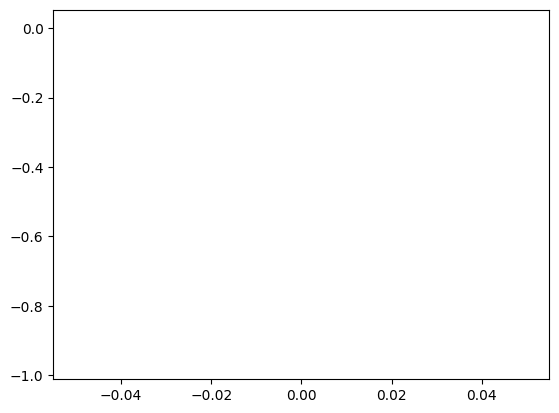

In [39]:
plt.plot(smoothed_lda_mean_miss)
plt.plot(smoothed_lda_mean_hit)
plt.show()

In [51]:
import numpy as np
import matplotlib.pyplot as plt

def plot_traces_grid(lda_traces, lda_mean, correlations, title, color, rows=7, cols=10, save_path=None):
    """
    Plot individual LDA traces overlaid on the class mean in a grid format.

    Parameters:
    - lda_traces: List/array of individual traces.
    - lda_mean: Mean trace of the corresponding class.
    - correlations: List/array of correlation values.
    - title: Title for the entire grid.
    - color: Color used for both individual and mean traces (mean will be darker).
    - rows, cols: Number of subplots in the grid.
    - save_path: Path to save the figure as SVG. If None, the plot is shown instead.
    """
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2), sharex=False, sharey=False)
    axes = axes.flatten()

    num_traces = len(lda_traces)
    num_plots = min(rows * cols, num_traces)

    time_axis = np.linspace(-40, 0, 200)

    all_traces = np.concatenate([lda_traces, [lda_mean]], axis=0)
    all_traces = np.nan_to_num(all_traces, nan=0, posinf=0, neginf=0)

    y_min = np.min(all_traces)
    y_max = np.max(all_traces)

    for i in range(num_plots):
        ax = axes[i]

        correlation = correlations[i] if i < len(correlations) else np.nan
        ax.plot(time_axis, lda_traces[i], color=color, alpha=0.7, linewidth=1)
        ax.plot(time_axis, lda_mean, color=color, alpha=1.0, linewidth=2)

        ax.set_title(f"Corr: {correlation:.2f}", fontsize=10)
        ax.set_xlim(-40, 0)
        ax.set_ylim(y_min, y_max)
        ax.set_xlabel("Time (s)")
        ax.set_ylabel("LDA projection")
        ax.set_xticks(np.linspace(-40, 0, 5))
        y_ticks = np.round(np.linspace(y_min, y_max, 5), 1)
        ax.set_yticks(y_ticks)
        ax.set_yticklabels([f"{ytick:.1f}" for ytick in y_ticks])

    for i in range(num_plots, len(axes)):
        fig.delaxes(axes[i])

    plt.suptitle(title, fontsize=12)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    # plt.savefig(save_path, format="svg")
    plt.show()

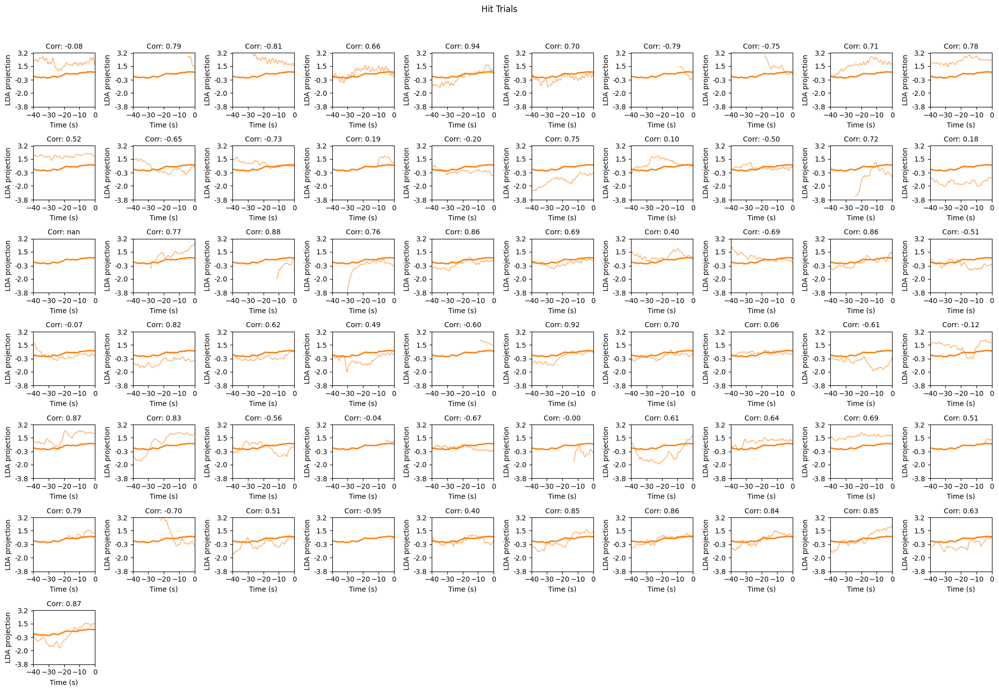

In [52]:
plot_traces_grid(
    smoothed_lda_traces_hit,
    smoothed_lda_mean_hit,
    correlations_hit,
    "Hit Trials",
    color="#ff7f0e",
    save_path="hit_traces.svg"
)

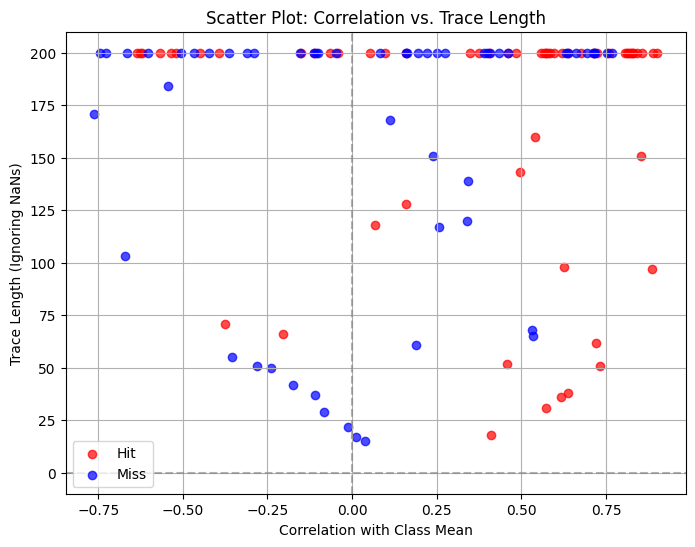

In [110]:
import numpy as np
import matplotlib.pyplot as plt

# Compute trace lengths (ignoring NaNs)
trace_lengths_hit = [np.count_nonzero(~np.isnan(trace)) for trace in lda_traces_hit]
trace_lengths_miss = [np.count_nonzero(~np.isnan(trace)) for trace in lda_traces_miss]

# Convert correlations to arrays
correlations_hit = np.array(correlations_hit)
correlations_miss = np.array(correlations_miss)

# Scatter plot
plt.figure(figsize=(8, 6))

# Plot hit trials (red)
plt.scatter(correlations_hit, trace_lengths_hit, color='red', alpha=0.7, label='Hit')

# Plot miss trials (blue)
plt.scatter(correlations_miss, trace_lengths_miss, color='blue', alpha=0.7, label='Miss')

# Labels and legend
plt.xlabel("Correlation with Class Mean")
plt.ylabel("Trace Length (Ignoring NaNs)")
plt.title("Scatter Plot: Correlation vs. Trace Length")
plt.axhline(0, color='gray', linestyle='--', alpha=0.6)  # Reference line at y=0
plt.axvline(0, color='gray', linestyle='--', alpha=0.6)  # Reference line at x=0
plt.legend()
plt.grid(True)

plt.show()

In [ ]:
correlations_hit = []
correlations_miss = []
def nan_corr_with_indices(x, y):
    mask = ~np.isnan(x) & ~np.isnan(y)
    valid_idx = np.where(mask)[0]

    if len(valid_idx) < 3:
        return np.nan, valid_idx

    corr = np.corrcoef(x[valid_idx], y[valid_idx])[0, 1]
    return corr, valid_idx
    
print("\nHIT TRACES")
for i, trace in enumerate(smoothed_lda_traces_hit):
    corr, valid_idx = nan_corr_with_indices(trace, smoothed_lda_mean_hit)
    correlations_hit.append(corr)
    # print(f"Hit trial {i}: corr={corr}, valid_indices={valid_idx}")

print("\nMISS TRACES")
for i, trace in enumerate(smoothed_lda_traces_miss):
    corr, valid_idx = nan_corr_with_indices(trace, smoothed_lda_mean_miss)
    correlations_miss.append(corr)
    # print(f"Miss trial {i}: corr={corr}, valid_indices={valid_idx}")